# BM4Implicit versus RK4 — visualization

Load the latest completed calculation, or set `RUN_DIRECTORY` to a previous run. No numerical integration is performed here. Existing saved results are available immediately. Run [calculation.ipynb](calculation.ipynb) only to produce a new study.


## 1. Physical energy is not an invariant of this time-dependent field

The project convention is

$$H(t,x,y)=\langle\Phi\rangle_\rho(t,x,y),\qquad
\dot x=-\partial_y H,\quad \dot y=\partial_x H.$$

With `indx=(0,1)`, the loaded potential includes the mean and the dominant
positive-frequency mode. Consequently,

$$\frac{dH(t,z(t))}{dt}=\partial_tH(t,z(t)),$$

so **$H(t,z_n)-H(0,z_0)$ is not a conservation error**. We distinguish:

| Quantity | Definition | Interpretation |
|---|---|---|
| Physical variation | $H(t,z_n)-H(0,z_0)$ | Includes true time dependence |
| Physical-energy error | $H(t,z_n)-H(t,z_{\rm DOP853})$ | Accuracy against the same interpolated ODE |
| Extended balance | $\kappa'=-\partial_tH$, $K=H+\kappa$, $\kappa(0)=0$ | $K$ is constant in the continuous augmented system |
| Envelope | $E_K(T,h)=\max_{0\le t_n\le T}|K_n-K_0|$ | Does the largest error continue to grow? |
| Trajectory error | minimum-image distance to DOP853 | Energy accuracy does not establish orbit accuracy |

BM4's $\kappa$ is reconstructed by `GCGeneralizedEnergyObserver` from its twelve
accepted base stages, with the project's $\kappa=k/2$ normalization. No sparse-output
quadrature is used. RK4 advances $\kappa$ with the same four RK stages as its state.

`BM4Implicit` uses one reduced Hairer projection around the complete BM4 composition.
It accepts the **physical state only**; the observer does not turn it into a fully
extended solver. A small physical symplectic defect at fixed time does not prove
that the reconstructed $(x,y,t,\kappa)$ map is symplectic.

The familiar $O(h^4)$ long-time energy estimate requires a suitably regular
autonomous Hamiltonian, a symplectic map, a small constant step, and a bounded
regularity domain. Those hypotheses must not be assumed from a finite plot.
In particular, cubic spatial splines have limited regularity, and Newton error,
roundoff, reference resolution and chaotic separation can influence the measured
envelopes. The $h^4$ lines below are comparison guides, not guaranteed bounds.

In [1]:
from pathlib import Path
import json
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Markdown
from diagnostics.paths import find_project_root
from diagnostics.reference_trajectory import load_reference_trajectory
from diagnostics.gc_energy_bound import load_energy_bound_result
from studies.gc_energy_bound import energy_bound_conclusions
from visualization.radial_reference import plot_radial_reference_audit
from visualization.notebooks import display_animation
from visualization.gc_energy_bound import (
    show_energy_table, plot_energy_histories, plot_energy_refinement, plot_energy_blocks,
    plot_gc_accuracy_and_cost, plot_bm4_nonlinear_work, animate_energy_orbit,
)

ROOT = find_project_root(Path.cwd())
RUN_DIRECTORY = None  # Optional absolute path or path relative to the project root.
DISPLAY_PARTICLE = 0
DISPLAY_LEVEL = 0
ANIMATION_FRAMES, ANIMATION_FPS = 201, 10
manifest_path = ROOT / "outputs/developements/energy/BM4_RK4/latest_run.json"
if RUN_DIRECTORY is None:
    if not manifest_path.is_file():
        raise FileNotFoundError("Run calculation.ipynb first or set RUN_DIRECTORY to a completed run.")
    RUN_DIRECTORY = json.loads(manifest_path.read_text())["run_directory"]
RUN_DIRECTORY = ROOT / Path(RUN_DIRECTORY)
result_paths = [RUN_DIRECTORY / f"particle_{i}/gc_h5_energy_bound.h5" for i in range(1, 4)]
results = [load_energy_bound_result(path) for path in result_paths]
assert 0 <= DISPLAY_PARTICLE < len(results)
result = results[DISPLAY_PARTICLE]
RESULT_PATH = result_paths[DISPLAY_PARTICLE]
STEPS = tuple(result.metadata["config"]["steps"])
assert 0 <= DISPLAY_LEVEL < len(STEPS)
OUTPUT_DIRECTORY = RUN_DIRECTORY / "visualization"
OUTPUT_DIRECTORY.mkdir(parents=True, exist_ok=True)
plt.rcParams.update({"figure.dpi": 110, "axes.grid": True, "grid.alpha": 0.2})
print("Loaded run:", RUN_DIRECTORY)
print("Detailed figures show particle", DISPLAY_PARTICLE + 1)


Loaded run: /home/juan/Proyectos/GC2D_intranet/outputs/developements/energy/BM4_RK4/calculation/2026-09-14/20260914_115553_d9871731
Detailed figures show particle 1


Standard reference directory: /home/juan/Proyectos/GC2D_intranet/data/trajectory/h5_three_radial_dop853_t35
Reference field SHA-256: 0caa0a26e718a2c2dcc88265691c0a1ab3aef5116e5c7469387fe13e22bd3db1
Maximum per-particle DOP853/Radau distance: [5.50447209e-06 2.82184553e-07 5.82193843e-08]


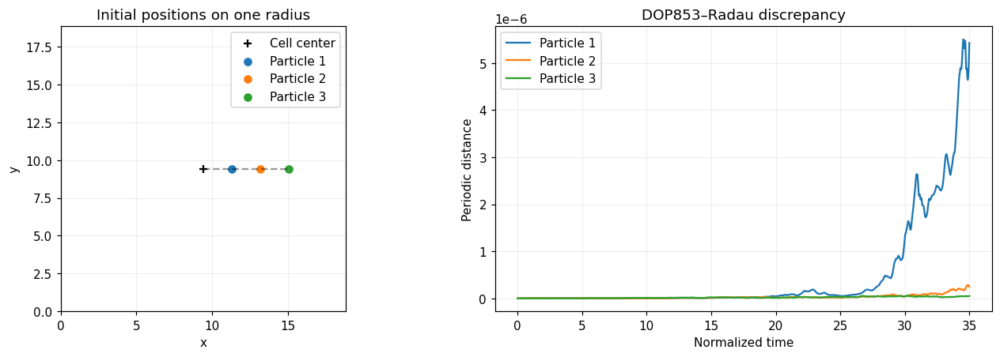

In [2]:
standard_reference = load_reference_trajectory(ROOT / "data/trajectory/h5_three_radial_dop853_t35")
print("Standard reference directory:", standard_reference.paths.directory)
print("Reference field SHA-256:", standard_reference.metadata["dynamics_fingerprint_sha256"])
print("Maximum per-particle DOP853/Radau distance:", standard_reference.audit_distances.max(axis=1))
figure, _ = plot_radial_reference_audit(standard_reference)
figure.savefig(OUTPUT_DIRECTORY / "initial_position_and_reference_audit.png", dpi=160)
plt.show()

## 5. Energy histories: distinguish physical change, error and balance

The top-left plot can vary even when the reference is accurate. The top-right plot
measures physical-energy accuracy. The lower plots test the extended-balance
envelope. A constant-looking curve on a logarithmic scale must be checked against
the horizon table and the signed block ranges below.

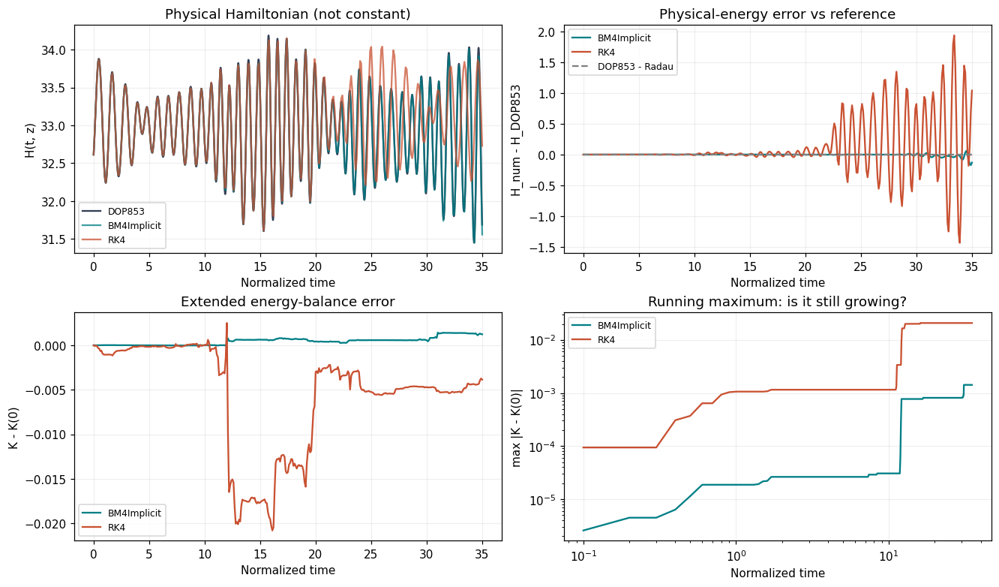

method,metric,horizon,maximum,growth ratio
BM4Implicit,K,1.00000e+00,1.86572e-05,None
BM4Implicit,K,5.00000e+00,2.62649e-05,1.407761523589796
BM4Implicit,K,1.00000e+01,3.05106e-05,1.16164911985871
BM4Implicit,K,2.50000e+01,8.10103e-04,26.5515473161488
BM4Implicit,K,3.50000e+01,1.42052e-03,1.7535042342279066
BM4Implicit,H_reference,1.00000e+00,2.18884e-05,None
BM4Implicit,H_reference,5.00000e+00,2.28922e-05,1.0458596833762952
BM4Implicit,H_reference,1.00000e+01,2.57908e-04,11.266222015967298
BM4Implicit,H_reference,2.50000e+01,3.82022e-03,14.812325602232402
BM4Implicit,H_reference,3.50000e+01,1.70616e-01,44.6613566043738


In [3]:
figure = plot_energy_histories(result, level=DISPLAY_LEVEL)
figure.savefig(OUTPUT_DIRECTORY / "energy_histories.png", dpi=160)
plt.show()
show_energy_table([row for row in result.envelopes if row["step"] == STEPS[DISPLAY_LEVEL]],
                 ("method", "metric", "horizon", "maximum", "growth_ratio"))

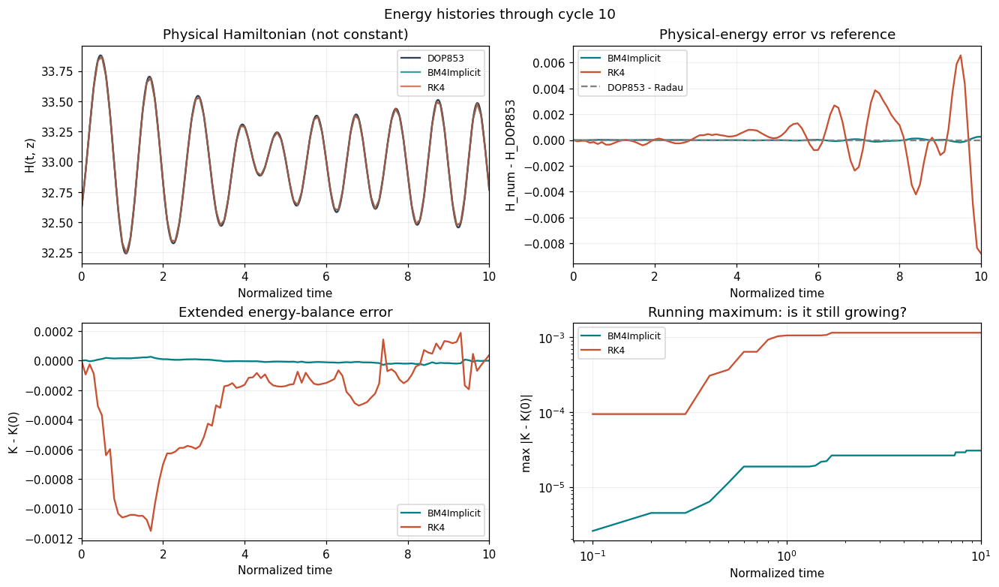

In [4]:
# Zoom of execution [7]: one normalized time unit is one characteristic cycle.
MAX_CYCLE = 10.0
figure = plot_energy_histories(result, level=DISPLAY_LEVEL)
for ax in figure.axes:
    for line in ax.lines:
        x, y = np.asarray(line.get_xdata()), np.asarray(line.get_ydata())
        visible = (x >= 0.0) & (x <= MAX_CYCLE)
        line.set_data(x[visible], y[visible])
    ax.relim()
    ax.autoscale_view()
    if ax.get_xscale() == "log":
        ax.set_xlim(right=MAX_CYCLE)
    else:
        ax.set_xlim(0.0, MAX_CYCLE)
figure.suptitle("Energy histories through cycle 10")
figure.savefig(OUTPUT_DIRECTORY / "energy_histories_cycle_10.png", dpi=160)
plt.show()


### Energy balance and separation between BM4Implicit and RK4
Both panels use the same particle, fixed step and normalized time interval [0, 10]. The lower panel is the minimum-image periodic distance between the two numerical trajectories, in normalized spatial units. It measures method disagreement, not error against DOP853.


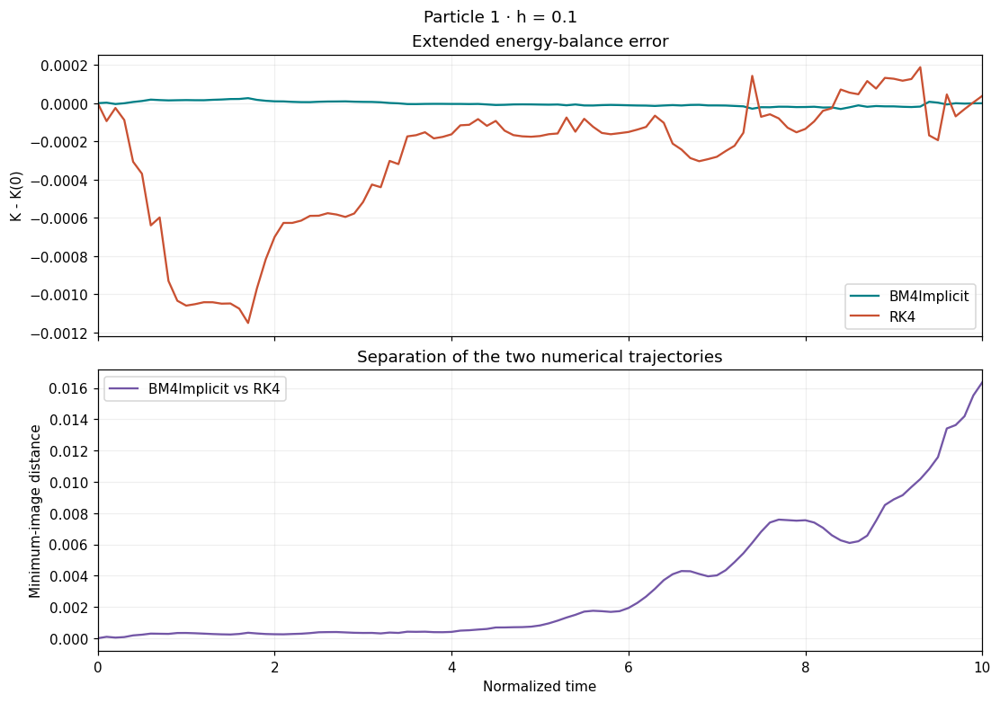

In [5]:
# Compare the same initial particle advanced by the two numerical methods.
from studies._trajectory_distances import periodic_particle_distances
from visualization.gc_energy_bound import COLORS

MAX_CYCLE = 10.0  # Normalized time; the same interval as the energy zoom above.
arrays = result.arrays
prefix = f"h{DISPLAY_LEVEL}"
times = arrays[f"{prefix}/times"]
visible = (times >= 0.0) & (times <= MAX_CYCLE)
period = float(arrays["domain"][2])
separation = periodic_particle_distances(
    arrays[f"{prefix}/BM4Implicit/states"],
    arrays[f"{prefix}/RK4/states"],
    period=period,
)[0]
assert separation.shape == times.shape
assert np.isfinite(separation).all()
assert np.isclose(separation[0], 0.0)

figure, axes = plt.subplots(2, 1, figsize=(10, 7), sharex=True, constrained_layout=True)
for method in ("BM4Implicit", "RK4"):
    axes[0].plot(times[visible], arrays[f"{prefix}/{method}/K_error"][visible],
                 color=COLORS[method], label=method)
axes[0].set(title="Extended energy-balance error", ylabel="K - K(0)")
axes[0].legend()
axes[1].plot(times[visible], separation[visible], color="#7356A6",
             label="BM4Implicit vs RK4")
axes[1].set(title="Separation of the two numerical trajectories",
             xlabel="Normalized time", ylabel="Minimum-image distance", xlim=(0, MAX_CYCLE))
axes[1].legend()
for ax in axes:
    ax.grid(alpha=0.2)
figure.suptitle(f"Particle {DISPLAY_PARTICLE + 1} · h = {STEPS[DISPLAY_LEVEL]:g}")
figure.savefig(OUTPUT_DIRECTORY / "energy_and_method_separation_cycle_10.png", dpi=160)
plt.show()


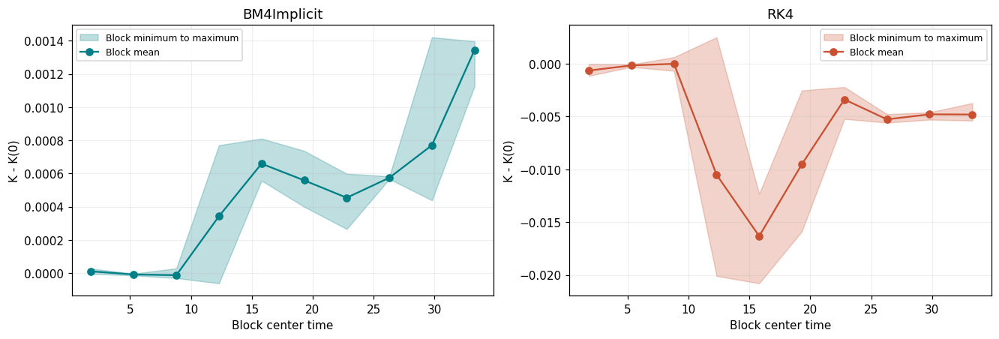

In [6]:
figure = plot_energy_blocks(result, level=DISPLAY_LEVEL)
figure.savefig(OUTPUT_DIRECTORY / "energy_blocks.png", dpi=160)
plt.show()

## 6. Refining h at fixed T

The empirical slope is fitted to the three finest steps separately for every horizon.
It need not equal four for a particular diagnostic, a long chaotic trajectory, or a
piecewise polynomial field. Check whether physical-energy and trajectory errors lie
well above their DOP853/Radau discrepancy before interpreting them. Small errors near
that floor cannot establish a convergence rate. There is no reference-derived floor
for the BM4 observer's momentum quadrature; its balance is evaluated against the
constant continuous $K_0$ and needs its own step/tolerance sensitivity check.

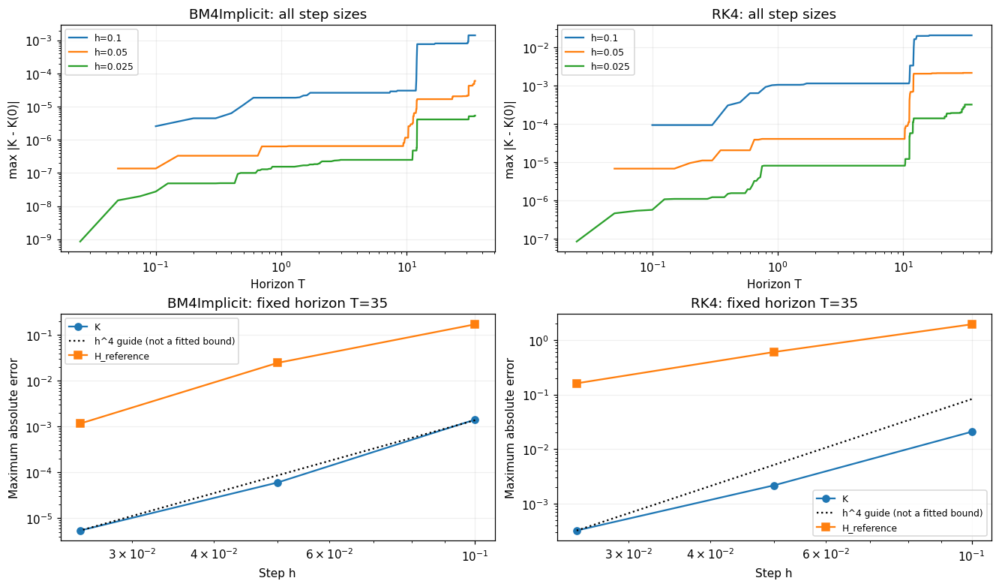

method,metric,horizon,slope
BM4Implicit,K,1.00000e+00,3.45749e+00
BM4Implicit,K,5.00000e+00,3.36107e+00
BM4Implicit,K,1.00000e+01,3.46916e+00
BM4Implicit,K,2.50000e+01,3.80909e+00
BM4Implicit,K,3.50000e+01,4.02207e+00
BM4Implicit,H_reference,1.00000e+00,4.48668e+00
BM4Implicit,H_reference,5.00000e+00,3.81275e+00
BM4Implicit,H_reference,1.00000e+01,4.93862e+00
BM4Implicit,H_reference,2.50000e+01,4.03438e+00
BM4Implicit,H_reference,3.50000e+01,3.59772e+00


In [7]:
figure = plot_energy_refinement(result)
figure.savefig(OUTPUT_DIRECTORY / "energy_refinement.png", dpi=160)
plt.show()
show_energy_table(result.orders, ("method", "metric", "horizon", "slope"))

## 7. Trajectory accuracy, runtime and nonlinear work

Coordinates are unwrapped in the orbit plots. Error distances use the minimum-image
periodic convention, so crossing a cell edge does not create an artificial jump in
the reported separation. Runtime ratios below compare the same step and saved grid.
Projection multipliers are numerical corrections, not physical forces.

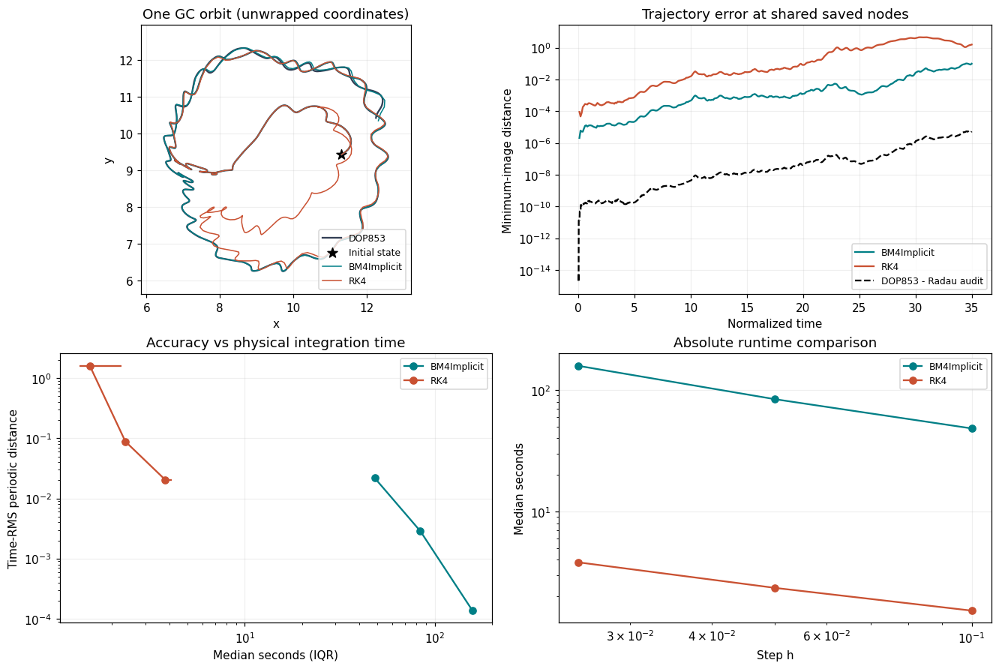

method,step,runtime median,runtime q25,runtime q75
BM4Implicit,1.00000e-01,4.82803e+01,4.81927e+01,4.83367e+01
RK4,1.00000e-01,1.52690e+00,1.34435e+00,2.24511e+00
BM4Implicit,5.00000e-02,8.39863e+01,8.22178e+01,8.42724e+01
RK4,5.00000e-02,2.34947e+00,2.24705e+00,2.46522e+00
BM4Implicit,2.50000e-02,1.58075e+02,1.55658e+02,1.58360e+02
RK4,2.50000e-02,3.81363e+00,3.75664e+00,4.10421e+00


h=0.1: median BM4/RK4 runtime ratio = 31.62
h=0.05: median BM4/RK4 runtime ratio = 35.747
h=0.025: median BM4/RK4 runtime ratio = 41.45


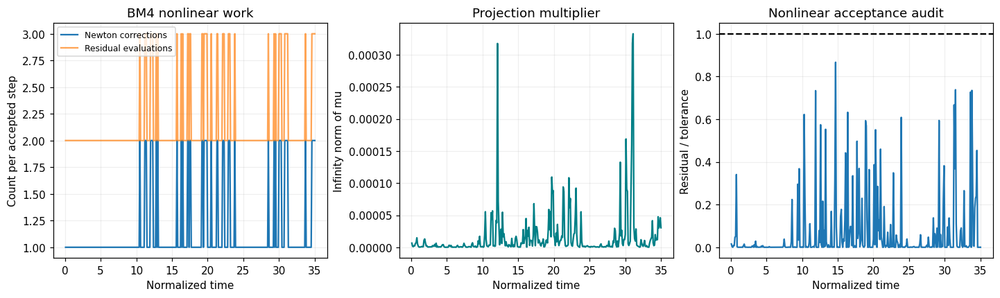

step,solves per step,newton mean,newton max,newton total,residual evaluations mean,residual evaluations total,residual tolerance ratio max
1.00000e-01,1,1.14857e+00,2,402,2.14857e+00,752,8.66446e-01
5.00000e-02,1,1.00000e+00,1,700,2.00000e+00,1400,7.50660e-01
2.50000e-02,1,1.00000e+00,1,1400,2.00000e+00,2800,2.01666e-03


step,mu mean,mu rms,mu max,mu final
1.00000e-01,1.53078e-05,4.00503e-05,3.32661e-04,3.04835e-05
5.00000e-02,9.00595e-07,2.60153e-06,2.38386e-05,3.35126e-06
2.50000e-02,5.70804e-08,1.96546e-07,2.65793e-06,3.63788e-07


In [8]:
figure = plot_gc_accuracy_and_cost(result, level=DISPLAY_LEVEL)
figure.savefig(OUTPUT_DIRECTORY / "trajectory_and_cost.png", dpi=160)
plt.show()
show_energy_table(result.summary, ("method", "step", "runtime_median", "runtime_q25", "runtime_q75"))
for step in STEPS:
    samples = {row["method"]: row["runtime_median"] for row in result.summary if row["step"] == step}
    print(f"h={step:g}: median BM4/RK4 runtime ratio = {samples['BM4Implicit']/samples['RK4']:.5g}")

figure = plot_bm4_nonlinear_work(result, level=DISPLAY_LEVEL)
figure.savefig(OUTPUT_DIRECTORY / "bm4_nonlinear_work.png", dpi=160)
plt.show()
implicit_rows = [row for row in result.summary if row["method"] == "BM4Implicit"]
show_energy_table(implicit_rows, ("step", "solves_per_step", "newton_mean", "newton_max",
    "newton_total", "residual_evaluations_mean", "residual_evaluations_total", "residual_tolerance_ratio_max"))
show_energy_table(implicit_rows, ("step", "mu_mean", "mu_rms", "mu_max", "mu_final"))

In [9]:
animation = animate_energy_orbit(result, level=DISPLAY_LEVEL,
                                 frame_count=ANIMATION_FRAMES, fps=ANIMATION_FPS)
display_animation(animation, interactive=True)

Once 
 
 Loop 
 
 Reflect

## 8. What the completed run supports

The conclusion below is derived from computed values, including the last-interval
envelope growth. The descriptive threshold is explicit in the configuration.
Even an apparent plateau over normalized time 35 does not prove an infinite-time bound.
To extend the horizon, obtain a separately audited reference, keep h fixed, compare the block means/ranges, and repeat with
tighter Newton tolerances before attributing slow growth to the method itself.
For autonomous conservation from the same data source, repeat the experiment with
the mean-only `(0,)` field and label that change explicitly.

In [10]:
conclusions = energy_bound_conclusions(result)
display(Markdown(conclusions))
(OUTPUT_DIRECTORY / "conclusions.md").write_text(conclusions + "\n", encoding="utf-8")
print("To reopen a completed run without solving again:")
print(f"result = load_energy_bound_result({str(RESULT_PATH)!r})")

At h=0.1, over 35 normalized time units:
- BM4Implicit: max |K-K0|=1.420519e-03; max |H-Href|=1.706162e-01; last-interval growth ratio=1.7535042342279066; the envelope is still growing.
  Physical-energy error / measured reference discrepancy = 1.735e+04. The error exceeds that measured discrepancy by at least a factor of ten.
- RK4: max |K-K0|=2.079668e-02; max |H-Href|=1.939358e+00; last-interval growth ratio=1.0; little observed envelope growth.
  Physical-energy error / measured reference discrepancy = 1.972e+05. The error exceeds that measured discrepancy by at least a factor of ten.
- Fastest median physical integration: RK4 (1.526903e+00).
- Smallest time-RMS trajectory error: BM4Implicit (2.190973e-02).
- Smallest time-RMS physical-energy error: BM4Implicit (1.847430e-02).
A finite-window plateau is evidence, not a proof of a time-uniform bound. Check the reference floor, step refinement, spline regularity and Newton tolerance. Small physical-energy error alone does not validate the trajectory.

To reopen a completed run without solving again:
result = load_energy_bound_result('/home/juan/Proyectos/GC2D_intranet/outputs/developements/energy/BM4_RK4/calculation/2026-09-14/20260914_115553_d9871731/particle_1/gc_h5_energy_bound.h5')


## Project sources and interpretation

- [HDF5 import and units](../../../../docs/dynamics/gc2d-h5-import.md).
- [Physical guiding-center dynamics](../../../../src/dynamics/gc.py).
- [BM4Implicit method and projection](../../../../docs/models/bm4-implicit/simulation/bm4-simulation-architecture.md).
- [BM4 accepted-stage energy observer](../../../../src/diagnostics/energy/observer.py).
- [Classical RK4 and optional momentum evolution](../../../../src/simulation/methods/classical/rk4.py).
- [DOP853/Radau reference pipeline](../../../../src/studies/reference_trajectory.py).
- Hairer, Lubich and Wanner, *Geometric Numerical Integration*, IX.8: the long-time
  near-conservation result is conditional; it does not assert conservation of a
  time-dependent physical Hamiltonian.

This notebook studies the same interpolated guiding-center model as the project.
It does not validate the underlying measured field or the guiding-center approximation.

## All three particles and all requested step sizes

These figures reuse the completed results. Error curves use only shared saved reference times; no reference interpolation is performed.

### Particle 1, h=0.1

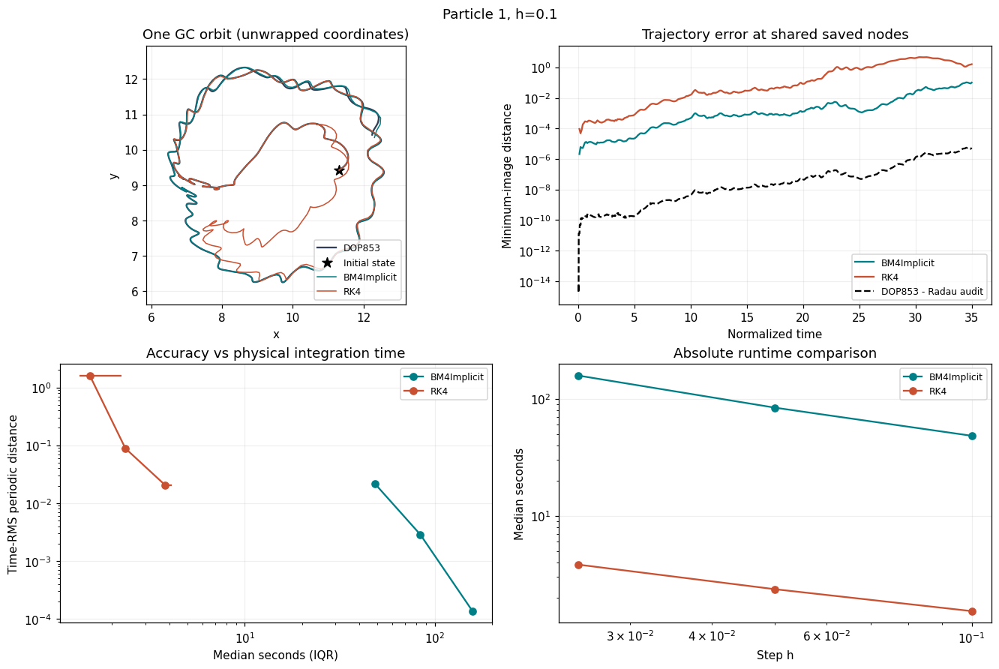

### Particle 1, h=0.05

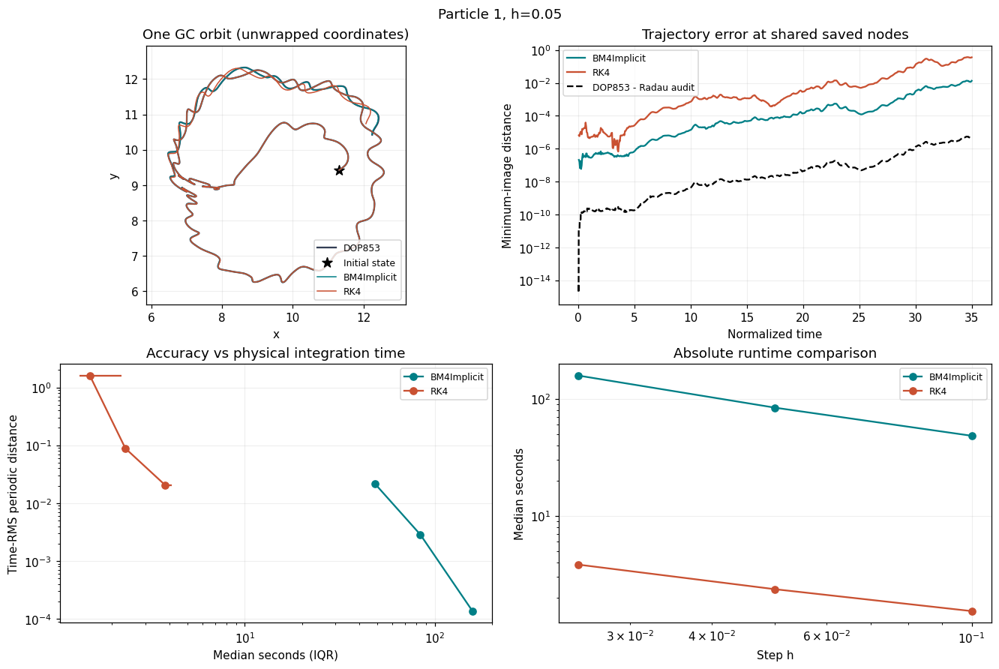

### Particle 1, h=0.025

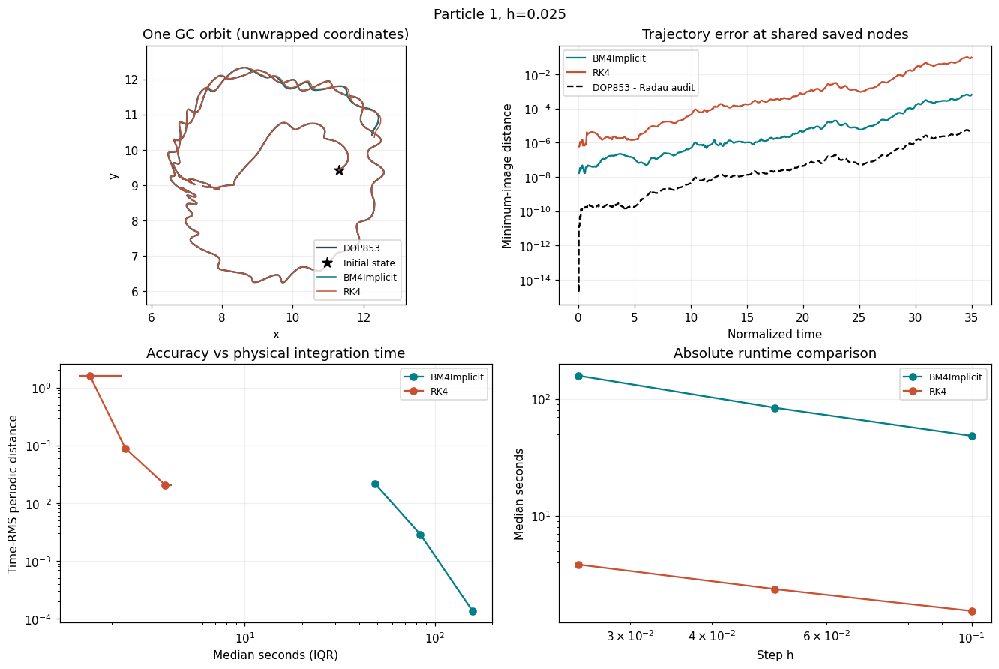

### Particle 2, h=0.1

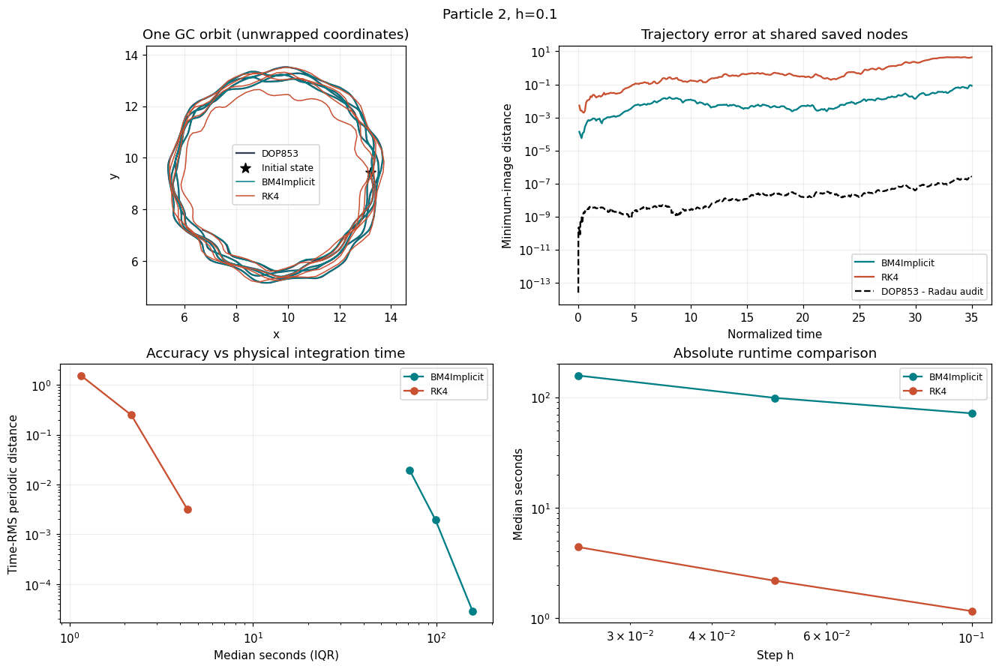

### Particle 2, h=0.05

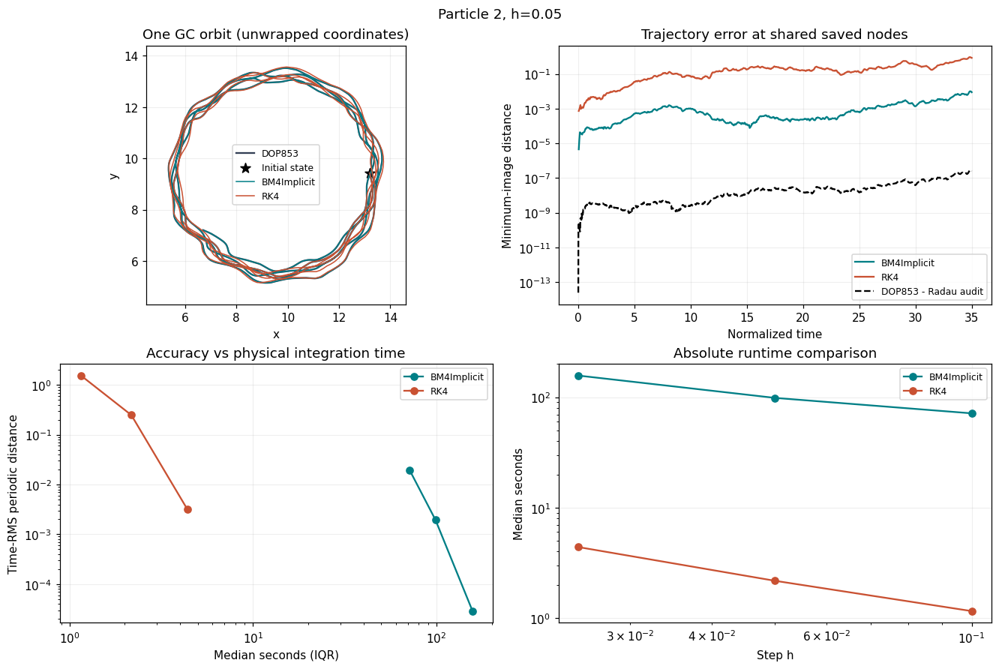

### Particle 2, h=0.025

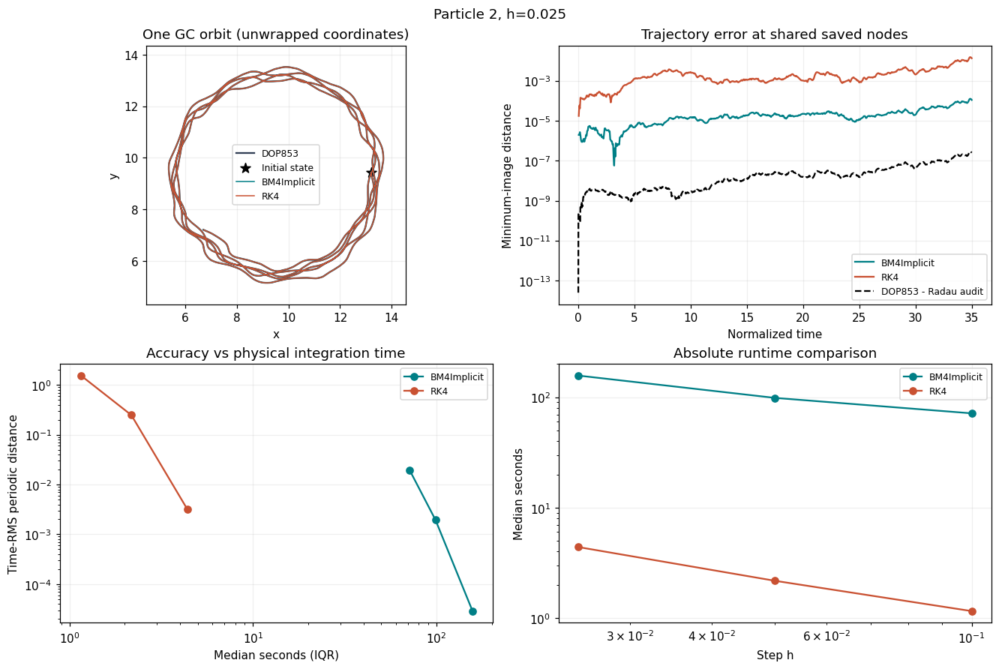

### Particle 3, h=0.1

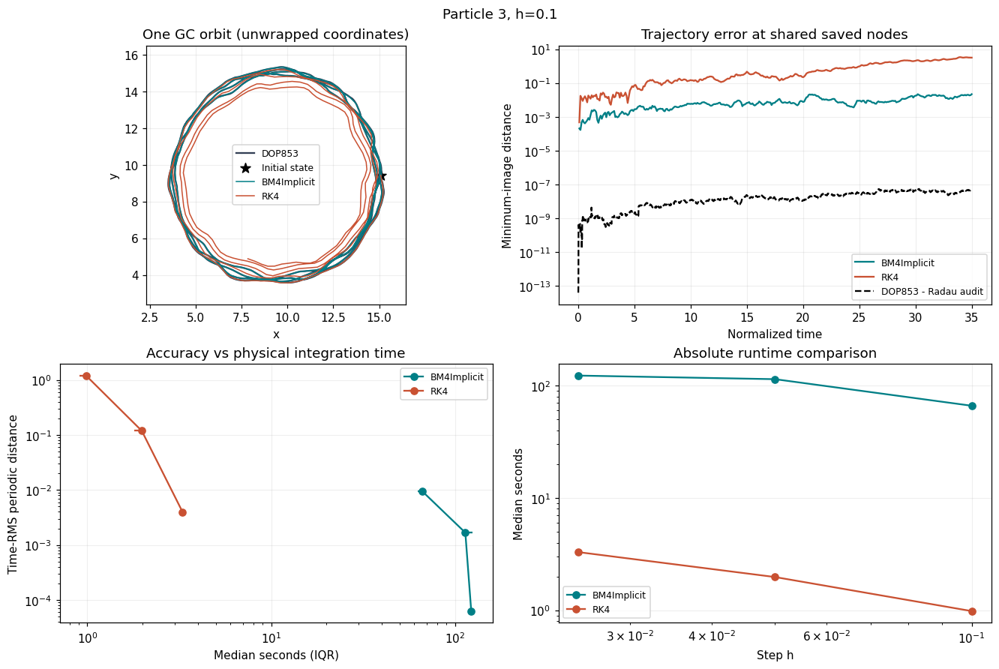

### Particle 3, h=0.05

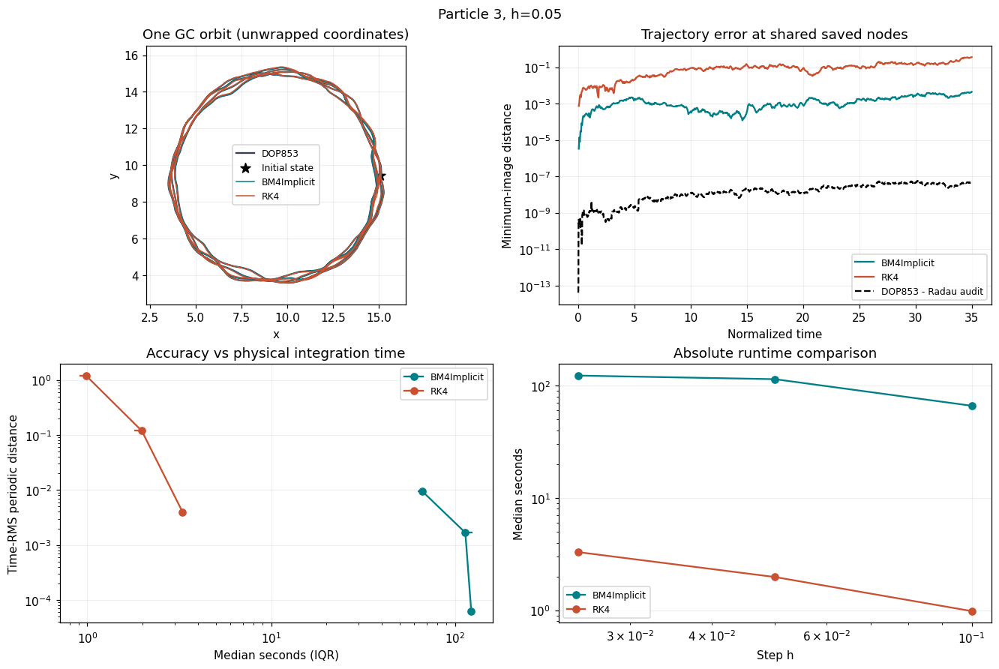

### Particle 3, h=0.025

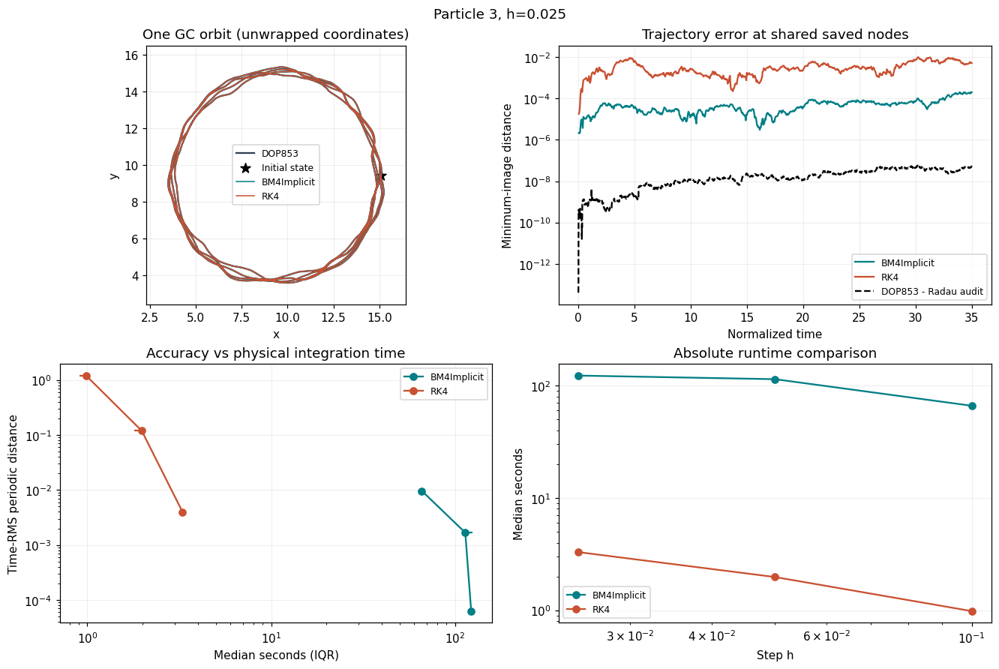

In [11]:
from visualization.gc_energy_bound import plot_gc_accuracy_and_cost
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

for particle, particle_result in enumerate(results, 1):
    for level, step in enumerate(particle_result.metadata["config"]["steps"]):
        display(Markdown(f"### Particle {particle}, h={step:g}"))
        figure = plot_gc_accuracy_and_cost(particle_result, level=level)
        figure.suptitle(f"Particle {particle}, h={step:g}")
        figure.savefig(OUTPUT_DIRECTORY / f"particle_{particle}_h{step:g}_comparison.png", dpi=140)
        plt.show()
